<a href="https://colab.research.google.com/github/HimankPatidar/Face-Recognition/blob/main/Face_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import shutil
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch

from pytube import YouTube
from facenet_pytorch import MTCNN, InceptionResnetV1
from IPython.display import Video
from PIL import Image
from torch.utils.data import DataLoader
from torchvision import datasets, transforms



In [2]:
import torch
import torchvision

print(f"PyTorch version: {torch.__version__}")
print(f"Torchvision version: {torchvision.__version__}")

PyTorch version: 2.8.0+cu128
Torchvision version: 0.23.0+cu128


In [3]:
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(f"Using {device} device")

Using cuda device


In [4]:
data_dir = Path("data")
print(data_dir)

data


In [11]:
video_name = "/Rohit Sharma Interviews Virat Kohli _ Kohli on His 71st Century _.mp4"

In [12]:
Video(video_name, width=400, embed=True)

In [13]:
frames_dir = data_dir / "frames"
frames_dir.mkdir(parents=True, exist_ok=True)
print(frames_dir)

data/frames


In [14]:
video_capture = cv2.VideoCapture(video_name)
frame_rate = round(video_capture.get(cv2.CAP_PROP_FPS))

print(f"Frame rate: {frame_rate}")

Frame rate: 24


In [15]:
interval = 6
frame_cnt = 0

print("Start Extracting individual frames...")
while True:
  ret, frame = video_capture.read()
  if not ret:
    print("Finished!")
    break

  if frame_cnt % interval == 0:
    frame_path = frames_dir / f"frame_{frame_cnt}.jpg"
    cv2.imwrite(frame_path, frame)

  frame_cnt += 1

video_capture.release()

Start Extracting individual frames...
Finished!


In [16]:
images_dir = data_dir / "images"
images_dir.mkdir(exist_ok = True)
print(images_dir)

data/images


In [17]:
virat_dir = images_dir / "virat"
virat_dir.mkdir(exist_ok = True)
print(virat_dir)

data/images/virat


In [18]:
rohit_dir= images_dir / "rohit"
rohit_dir.mkdir(exist_ok = True)
print(rohit_dir)

data/images/rohit


In [21]:
virat_imgs = [
  "frame_1002.jpg",
  "frame_1812.jpg",
  "frame_3468.jpg",
  "frame_4248.jpg",
  "frame19.jpg",
  "frame21.jpg",
  "frame22.jpg",
  "frame20.jpg"
]

rohit_imgs = [
    "frame_0.jpg",
    "frame_12.jpg",
    "frame1.jpg",
    "frame7.jpg",
    "frame5.jpg",
    "frame3.jpg"
]

In [22]:
virat_img_path = [frames_dir / i for i in virat_imgs]
rohit_img_path = [frames_dir / i for i in rohit_imgs]

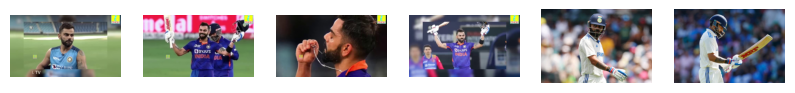

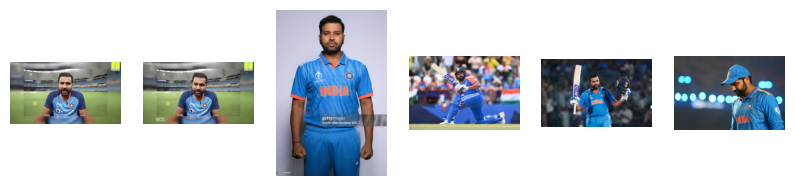

In [24]:
fig, axs = plt.subplots(1, 6, figsize=(10, 8))
for i, ax in enumerate(axs):
    ax.imshow(Image.open(virat_img_path[i]))
    ax.axis("off")

fig, axs = plt.subplots(1, 6, figsize=(10, 8))
for i, ax in enumerate(axs):
    ax.imshow(Image.open(rohit_img_path[i]))
    ax.axis("off")

In [26]:
for image_path in virat_img_path:
    shutil.copy(image_path, virat_dir)

for image_path in rohit_img_path:
  shutil.copy(image_path, rohit_dir)

print("Number of files in lupita directory:", len(list(virat_dir.iterdir())))
print("Number of files in christoph directory:", len(list(rohit_dir.iterdir())))


Number of files in lupita directory: 8
Number of files in christoph directory: 6


In [27]:
mtcnn = MTCNN(keep_all = True, min_face_size=40)
print(f"MTCNN min face size: {mtcnn.min_face_size}")
print(f"MTCNN keeping all faces: {mtcnn.keep_all}")


MTCNN min face size: 40
MTCNN keeping all faces: True


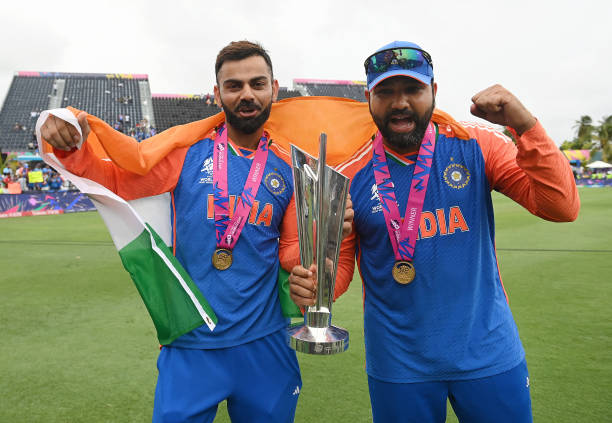

In [28]:
sample_img_file = "frame13.jpg"
sample_img_path = frames_dir / sample_img_file
sample_img = Image.open(sample_img_path)
sample_img

In [30]:
boxes, probs, landmarks = mtcnn.detect(sample_img, landmarks=True)

print("boxes : ", boxes)
print("probs : ", probs)
print("landmarks : ", landmarks)

boxes :  [[371.37384033203125 70.17439270019531 429.8022155761719 139.50146484375]
 [219.8294219970703 60.396820068359375 270.6947326660156
  125.82875061035156]
 [228.5976104736328 134.75819396972656 261.2998962402344
  167.29766845703125]]
probs :  [0.9999605417251587 0.9999308586120605 0.8925535082817078]
landmarks :  [[[386.88079833984375 91.62774658203125]
  [415.046875 89.02666473388672]
  [401.8724670410156 106.90434265136719]
  [390.8330993652344 121.76533508300781]
  [415.3622131347656 119.93507385253906]]

 [[234.7548370361328 86.96129608154297]
  [258.8223571777344 85.01781463623047]
  [248.49777221679688 98.38945007324219]
  [238.57534790039062 112.03851318359375]
  [258.57928466796875 110.50773620605469]]

 [[238.4308624267578 147.1172637939453]
  [250.38262939453125 145.60923767089844]
  [245.43763732910156 154.9967041015625]
  [241.02821350097656 160.63148498535156]
  [250.9916229248047 159.37039184570312]]]


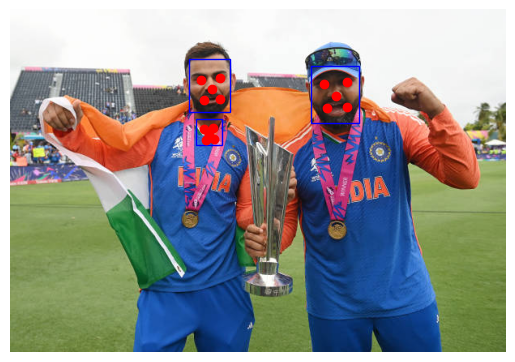

In [33]:
fig, ax = plt.subplots()
ax.imshow(sample_img)

for box, landmark in zip(boxes, landmarks):
    rect = plt.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="blue"
    )
    ax.add_patch(rect)
    for point in landmark:
        ax.plot(point[0], point[1], marker="o", color="red")
plt.axis("off");

In [34]:
resnet = InceptionResnetV1(pretrained="vggface2").eval()
print(f"InceptionResnet weight set: {resnet.pretrained}")

  0%|          | 0.00/107M [00:00<?, ?B/s]

InceptionResnet weight set: vggface2


In [35]:
dataset = datasets.ImageFolder(images_dir)
print(dataset)

Dataset ImageFolder
    Number of datapoints: 14
    Root location: data/images


In [36]:
idx_to_class = {i:c for c, i in dataset.class_to_idx.items()}
print(idx_to_class)

{0: 'rohit', 1: 'virat'}


In [37]:
def collate_fn(x):
  return x[0]

loader = DataLoader(dataset, collate_fn=collate_fn)
print(loader.dataset)

Dataset ImageFolder
    Number of datapoints: 14
    Root location: data/images


In [42]:
name_to_embeddings = {name: [] for name in idx_to_class.values()}

for img, idx in loader:
    faces, probs = mtcnn(img, return_prob=True)
    if faces is not None:
        for face, prob in zip(faces, probs):
            if prob >= 0.80:
                emb = resnet(face.unsqueeze(0))
                name_to_embeddings[idx_to_class[idx]].append(emb)

print(name_to_embeddings.keys())
print(type(name_to_embeddings["virat"]))
print(type(name_to_embeddings["rohit"]))

dict_keys(['rohit', 'virat'])
<class 'list'>
<class 'list'>


In [44]:
embeddings_virat = torch.stack(name_to_embeddings["virat"])
embeddings_rohit = torch.stack(name_to_embeddings["rohit"])

print(f"Shape of stack of embeddings for virat: {embeddings_virat.shape}")
print(f"Shape of stack of embeddings for rohit: {embeddings_rohit.shape}")


Shape of stack of embeddings for virat: torch.Size([9, 1, 512])
Shape of stack of embeddings for rohit: torch.Size([6, 1, 512])


In [51]:
avg_embedding_virat = torch.mean(embeddings_virat, dim=0)
avg_embedding_rohit = torch.mean(embeddings_rohit, dim=0)

print(f"Shape of avg_embedding_virat: {avg_embedding_virat.shape}")
print(f"Shape of avg_embedding_rohit: {avg_embedding_rohit.shape}")


Shape of avg_embedding_virat: torch.Size([1, 512])
Shape of avg_embedding_rohit: torch.Size([1, 512])


In [67]:
test_images  = [
    'frame22.jpg',
    "frame_0.jpg",
    "frame_1008.jpg",
    "frame_1026.jpg",

]

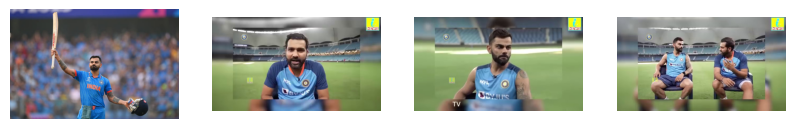

In [68]:
test_paths = [frames_dir / frame for  frame in test_images]

fig, axs = plt.subplots(1, len(test_paths), figsize=(10, 8))
for i, ax in enumerate(axs):
    ax.imshow(Image.open(test_paths[i]))
    ax.axis("off")

In [69]:
def recognize_faces(img_path, embedding_data, mtcnn, resnet, threshold=0.7):
    image = Image.open(img_path)
    boxes, probs = mtcnn.detect(image)
    cropped_images = mtcnn(image)

    if boxes is None:
        return

    # This sets the image size and draws the original image
    width, height = image.size
    dpi = 96
    fig = plt.figure(figsize=(width / dpi, height / dpi), dpi=dpi)
    axis = fig.subplots()
    axis.imshow(image)
    plt.axis("off")

    # Iterating over each face and comparing it against the pre-calculated embeddings
    # from our "database"
    for box, prob, face in zip(boxes, probs, cropped_images):
        if prob < 0.90:
            continue

        # Draw bounding boxes for all detected faces
        rect = plt.Rectangle(
            (box[0], box[1]),
            box[2] - box[0],
            box[3] - box[1],
            fill=False,
            color="blue",
        )
        axis.add_patch(rect)

        # Find the closest face from our database of faces
        emb = resnet(face.unsqueeze(0))
        distances = {}
        for known_emb, name in embedding_data:
            dist = torch.dist(emb, known_emb).item()
            distances[name] = dist

        closest, min_dist = min(distances.items(), key=lambda x: x[1])

        # Drawing the box with recognition results
        name = closest if min_dist < threshold else "Unrecognized"
        color = "red" if name == "Unrecognized" else "blue"
        label = f"{name} {min_dist:.2f}"

        axis.text(box[0], box[1], label, fontsize=8, color=color)

    plt.axis("off")
    plt.show()

In [71]:
embedding_list = [avg_embedding_virat, avg_embedding_rohit]
name_list = ["virat", "rohit"]
embedding_data = list(zip(embedding_list, name_list))
print(embedding_data[0][0].shape, embedding_data[0][1])
print(embedding_data[1][0].shape, embedding_data[1][1])

torch.Size([1, 512]) virat
torch.Size([1, 512]) rohit


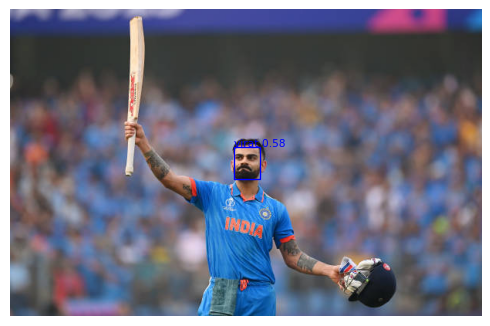

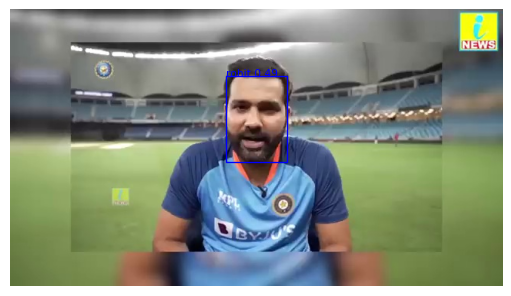

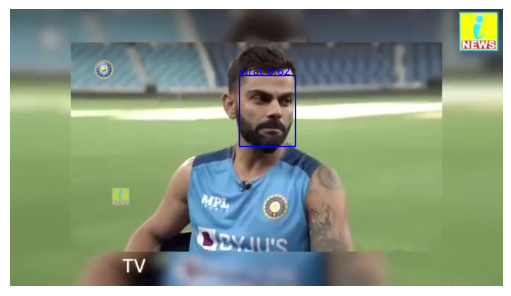

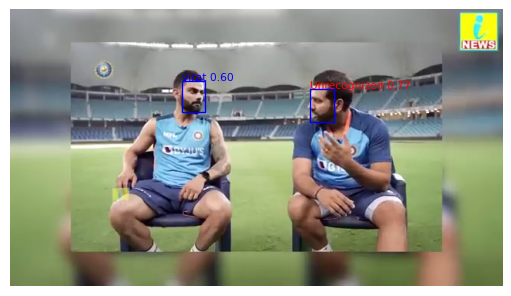

In [72]:
recognized_faces = []
for test_img_path in test_paths:
    recognized_faces.append(
        recognize_faces(test_img_path, embedding_data, mtcnn, resnet))


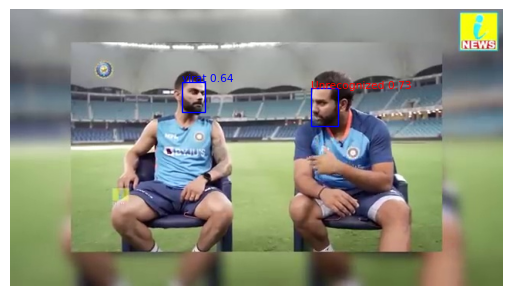

In [75]:
recognize_faces(frames_dir / "frame_1062.jpg", embedding_data, mtcnn, resnet)

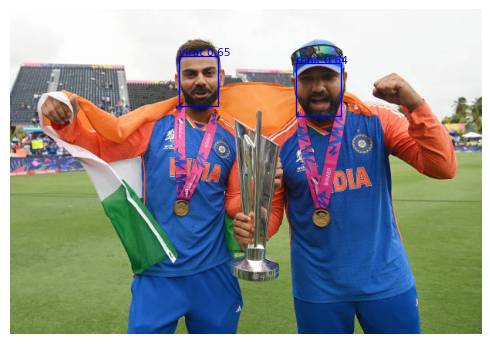

In [76]:
recognize_faces(frames_dir / "frame13.jpg", embedding_data, mtcnn, resnet)